<center>
    <img src="./images/mlfasp.png">
</center>

#### Prof. Dr. -Ing. Gerald Schuller <br> Jupyter Notebook: Renato Profeta

[Applied Media Systems Group](https://www.tu-ilmenau.de/en/applied-media-systems-group/) <br>
[Technische Universität Ilmenau](https://www.tu-ilmenau.de/)

# Variational Autoencoder (VAE)

The "Denoising Autoencoder" was robust against noise at its input, the audio signal. The "Variational Autoencoder" (VAE) now is robust against noise in its encoded domain, the "latent representation" in the "latent space".

In [1]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/6KzbMf9UTtg?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

In [2]:
%%html
<iframe width="900" height="400" src="https://jaan.io/what-is-variational-autoencoder-vae-tutorial/"></iframe>

https://towardsdatascience.com/understanding-variational-autoencoders-vaes-f70510919f73

Hence, similar to the Denoising Autoencoder, we also add a fixed noise during the training process, but instead at the input we add it to the encoded signal in the latent space. But the training could just find a solution where the latent representation just becomes very big, which would effectively "drown out" the noise, because it would appear relatively smaller.

Hence we introduce a "regularizer" term, which is added to the reconstruction loss function (usually the mean squared error). This is an added term for the loss function, usually with a factor for weighing the importance of the regularizer.

This regularizer term is minimized, if the "mean value", meaning the output of our original autoencoder, is minimized. This "punishes" large values in the encoded domain and keeps the small in the training.

We could now just train this network in this way. But to help the training, there is a parallel network which outputs the variance of the added noise for each element of the encoded signal in the latent space. In this way the training can start with very little noise to help the training find a useful and suitable representation.

To avoid the system staying in the no noise state, there is an additional component in the regularizer term, which is minimized if the added noise has unit variance, meaning a variance of value 1 for each component of the encoded latent representation. This effectively "punishes" too little or too much noise (too little more than too much).

Hence for this regularizer term we need a measure for how different the current noise distribution is from the desired (Gaussian) noise distribution with zero mean and unit variance.

In [3]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/eTAAetCXO8M?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

Let the current mean, from our usual autoencder, be $\mu$  , and the current standard deviation be $\sigma$ . In **Bayesian terms** this is called the **"posterior (observed) distribution”**. These are vectors of the size of the dimension of our latent space, meaning each element of the output vecor x of the encoder has its own mean and standard deviation.

Then our current noise probability distribution is:

$$\large
q(x) = \dfrac{1}{\sigma \sqrt{2\pi}} e^{\frac{-1}{2}\left(\frac{x-\mu}{\sigma}\right)^2}
$$

in our case the division by the standard deviation vector above is an element wise division, meaning we don't take into account cross-correlations.

Our desired probability distribution with $\sigma=1$ and $\mu=0$ is:

$$\large
p(x) = \dfrac{1}{\sigma \sqrt{2\pi}} e^{\frac{-1}{2}\left(x\right)^2}
$$

This is also called the **"prior (assumed) distribution"**.

A common information theoretic measure of how different 2 distributions p(x) and q(x) are is the “Kullback-Leibler Divergence" (KL-Divergence):

$$\large
D_{KL}\left(p \lVert q \right) = \int p(x) \log \left(\frac{p(x)}{q(x)} \right) dx
$$

In [4]:
%%html
<iframe width="900" height="400" src="https://en.wikipedia.org/wiki/Relative_entropy"></iframe>

Because we assume that the distributions of the different elements of our distributions are uncorrelated, we can simply sum up or average the KL-Divergences of each element in latent space, and our "variational loss" *vl* becomes:

$$\large
vl= \sum_{j=1}^J D_{KL} \left(p_j \lVert q_j \right)
$$

where $p_j=p(x_j)$ and $q_j=q(x_j)$

According to Appendix B of the paper:

Kingma and Welling. Auto-Encoding Variational Bayes, ICLR, 2014, https://arxiv.org/abs/1312.6114 this becomes:

$$\large
vl = - \dfrac{1}{2} \sum_{j=1}^J \left( 1 + \log \left(\sigma_j^2 \right) - \mu_j^2 - \sigma_j^2 \right)
$$

or in Pytorch and Python, with mu= $\mu$ and std= $\sigma$ :

`vl=-0.5*torch.mean(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))`

We can now compare this to a simple mean squared error function to our ideal of mu=0 and std=1:

`vl=torch.mean(mu.pow(2)+(1-std).pow(2))`

We can now plot it for mu=0 and standard deviation std ranging from 0 to 2:

In [5]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)  

device= cpu


In [6]:
def variational_loss(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #see also: see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    #https://arxiv.org/abs/1312.6114
    vl=-0.5*torch.mean(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))
    return vl
   
def variational_loss2(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #alternative: mean squared distance from ideal mu=0 and std=1:
    vl=torch.mean(mu.pow(2)+(1-std).pow(2))
    return vl

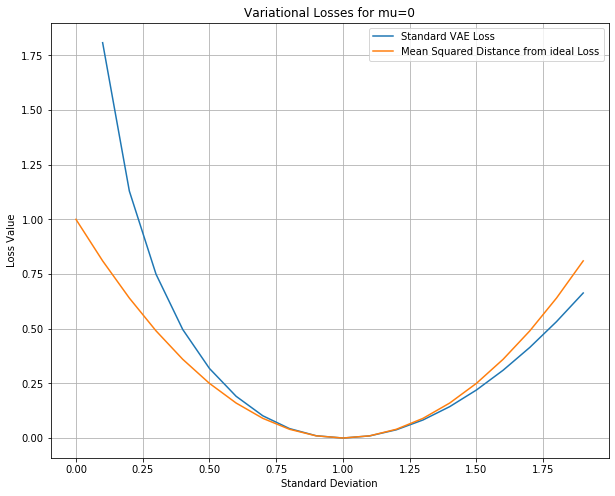

In [7]:
#Testing:
#compare the variational losses for different standard deviations std and mu=0:
std=np.arange(0,20)
vloss=torch.zeros(std.shape)
vloss2=torch.zeros(std.shape)
for std_ in std:
    vloss[std_]=variational_loss(torch.tensor([0.0]),torch.tensor(0.1*std_))
    vloss2[std_]=variational_loss2(torch.tensor([0.0]),torch.tensor([0.1*std_]))

plt.figure(figsize=(10,8))
plt.plot(0.1*std,np.array(vloss))
plt.plot(0.1*std,np.array(vloss2))
plt.ylabel('Loss Value')
plt.xlabel('Standard Deviation')
plt.title('Variational Losses for mu=0')
plt.legend(('Standard VAE Loss', 'Mean Squared Distance from ideal Loss'))
plt.grid()

Here we can see that both loss functions have the same minimum at *std=1*, as expected. But we see that the standard VAE loss has a steeper increase towards lower variances and less increase to higher variances. 

This means that low variances, the case of less noise, is more "punished" by the standard VAE loss, hence the training will be less likely to find a low noise solution.

We now have two network outputs to train:

`Yencmean=model.encodermean(X)`, which corresponds to our prevous encoder, and:

`Yencstd=model.encoderstd(X)`, which just produces the currently "allowable" standard deviation for each "mean" output during
the training process.

Since now our loss function consists of two components, we combine them in the training loop using a "Lagrange multiplier" to
combine them in an overall loss value.

In [8]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/RVE1bRVX-Y0?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

In [9]:
%%html
<iframe width="900" height="400" src="https://en.wikipedia.org/wiki/Lagrange_multiplier"></iframe>

The Lagrange multiplier simply weights the two components to achieve a desired trade-off between them. In our
case it looks like this:

```python
mse=loss_fn(Ypred, Y)
vl=variational_loss(Yencmean, Yencstd)
#vl=variational_loss2(Yencmean, Yencstd)
loss= mse + 0.01*vl```

where the factor "0.01" is our Lagrange multiplier.

Here we also see that we can choose between the two mentioned variational losses. *"variational_loss2"* is mean squared distance loss from above, the other is the standard VAE loss.

## Experiments

In our experiments the program first read in 2 speech files, as a simple training set. It is read in such that each file is one batch, using the function signal2pytorch(x).

It then defines the actual autoencoder in:

```python
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=8*1024, filter length of 2N, but only 32 outputs:
        #for the mean values:
        self.conv1mean=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)
       #for the standard devieation values:
       self.conv1std=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)

       #Synthesis filter bank:
       self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True)

    def encodermean(self, x):
        #Analysis:
        x = self.conv1mean(x)
        y = torch.tanh(x)
        return y
      
    def encoderstd(self, x):
        #Analysis:
        x = self.conv1std(x)
        y = torch.abs(torch.tanh(x))
        return y
      
    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek
      
    def forward(self, x):
        Yencmean=model.encodermean(x)
        Yencstd=model.encoderstd(x)
        #Yvariational= torch.normal(Yencmean, Yencstd)
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        #for the randn_like see also: https://github.com/pytorch/examples/blob/master/vae/main.py
        Ypred=model.decoder(Yvariational)
        return Ypred, Yencmean, Yencstd
```

Observe that the autoencoder uses filter kernel-sizes of 8\*2048, strides of 8\*1024, but we only use 32 channels. This means we have a very tight bottleneck here. The factor 8 here is for experimentation. Replace it by, e.g., 1. Then we have shorter filters, a shorter stride, and the bottleneck becomes less tight, but the results will be much more noisy!

Now, in addition to our previous encoder, which we here can call "conv1mean". It is an encoder for the standard deviation of the added noise in the encoded domain, which we call "conv1std".

#### torch.randn_like

In [10]:
%%html
<iframe width="900" height="400" src="https://pytorch.org/docs/stable/generated/torch.randn_like.html"></iframe>

#### Full Code for the VAE Model

In [11]:
# -*- coding: utf-8 -*-
__author__ = 'Gerald Schuller'
__copyright__ = 'G.S.'

"""
convolutional variational autoencoder for audio signals.
Denoising autoencoder is robust against noise at its input,
a variational autoencoder is robust against noise in its encoded domain.
Gerald Schuller, April 2020.
""";

# Ported to Jupyter Notebook by Renato Profeta, December 2020

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import scipy.io.wavfile as wav

In [13]:
if sys.version_info[0] < 3:
    # for Python 2
    import cPickle as pickle
else:
    # for Python 3
    import pickle
   
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)   

device= cpu


In [14]:
def signal2pytorch(x):
    #Function to convert a signal vector x, like a mono audio signal, into a 3-d Tensor that conv1d of Pytorch expects,
    #https://pytorch.org/docs/stable/nn.html
    #Argument x: a 1-d signal as numpy array
    #input x[batch,sample]
    #output: 3-d Tensor X for conv1d input.
    #for conv1d Input: (N,Cin,Lin), Cin: numer of input channels (e.g. for stereo), Lin: length of signal, N: number of Batches (signals) 
    X = np.expand_dims(x, axis=0)  #add channels dimension (here only 1 channel)
    if len(x.shape)==1: #mono:
        X = np.expand_dims(X, axis=0)  #add batch dimension (here only 1 batch)
    X=torch.from_numpy(X)
    X=X.type(torch.Tensor)
    X=X.permute(1,0,2)  #make batch dimension first
    return X

In [15]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=8*1024, filter length of 2N, but only 32 outputs:
        #for the mean values:
        self.conv1mean=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)
        #for the standard devieation values:
        self.conv1std=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)

        #Synthesis filter bank:
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True)

    def encodermean(self, x):
        #Analysis:
        x = self.conv1mean(x)
        y = torch.tanh(x)
        return y
      
    def encoderstd(self, x):
        #Analysis:
        x = self.conv1std(x)
        y = torch.abs(torch.tanh(x))
        return y
      
    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek
      
    def forward(self, x):
        Yencmean=model.encodermean(x)
        Yencstd=model.encoderstd(x)
        #Yvariational= torch.normal(Yencmean, Yencstd)
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        #for the randn_like see also: https://github.com/pytorch/examples/blob/master/vae/main.py
        Ypred=model.decoder(Yvariational)
        return Ypred, Yencmean, Yencstd

In [16]:
def variational_loss(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #see also: see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    #https://arxiv.org/abs/1312.6114
    vl=-0.5*torch.mean(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))
    return vl
   
def variational_loss2(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #alternative: mean squared distance from ideal mu=0 and std=1:
    vl=torch.mean(mu.pow(2)+(1-std).pow(2))
    return vl

In [17]:
import librosa

In [18]:
#alternative: speech:
#make training set with batch of 2 speech signals:
batch=2;
#fs, x0= wav.read('./audio/test2.wav') #get size of the speech files, all need to be identical
x0, fs = librosa.load("./audio/Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        #fs, x0= wav.read('./audio/test2.wav')
        x0, fs = librosa.load("./audio/Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        #fs, x0= wav.read('./audio/test3.wav')
        x0, fs = librosa.load("./audio/Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    #x=x*1.0/2**15 #normalize
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) #Convert to pytorch format, batch is first dimension    
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  #MSE

x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [19]:
Ypred, Yencmean, Yencstd = model(X)
    
#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  #the target signal with same length as model output
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_variational_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
"""
#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
#Ypred=model(X)
#Ypred=Ypred.detach()
#print("Ypred=", Ypred)
    
#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

outputlen= 286722
Input X.shape= torch.Size([2, 1, 288000])
Target Y.shape= torch.Size([2, 1, 286722])
Target Y= tensor([[[ 1.3333e-04,  3.9998e-04,  2.2221e-04,  ..., -2.1332e-03,
          -1.9999e-03, -1.7777e-03]],

        [[-7.2650e-02, -7.6821e-02, -7.2650e-02,  ...,  1.6392e-01,
           1.3665e-01,  1.0216e-01]]])
Y.type()= torch.FloatTensor


### Experiment 1

We let the program run like a conventional variational autoencoder. In the "for" loop for the training we have:

In [43]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/tb9AEXh3Sd4?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

In [20]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(2000):
        #Ypred, Yencmean, Yencstd = model(X)
        #mean values from the encoder network:
        Yencmean=model.encodermean(X)
          
        #standard deviation values from the network:
        Yencstd=model.encoderstd(X)
        #unit standard deviation:
        #Yencstd=torch.ones(Yencmean.shape)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        vl=variational_loss(Yencmean, Yencstd)
        #vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0.01*vl
        #loss= mse 
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.01256470661610365 variational loss= 3.434943675994873
10 mse= 0.01238525751978159 variational loss= 2.3315794467926025
20 mse= 0.011903086677193642 variational loss= 1.9798359870910645
30 mse= 0.011164676398038864 variational loss= 1.7860859632492065
40 mse= 0.010396158322691917 variational loss= 1.6594189405441284
50 mse= 0.009636940434575081 variational loss= 1.5674386024475098
60 mse= 0.008808366023004055 variational loss= 1.4951961040496826
70 mse= 0.008078509010374546 variational loss= 1.4349405765533447
80 mse= 0.007603420875966549 variational loss= 1.3833876848220825
90 mse= 0.007039071060717106 variational loss= 1.3382890224456787
100 mse= 0.006606727372854948 variational loss= 1.2975075244903564
110 mse= 0.006260245572775602 variational loss= 1.2610065937042236
120 mse= 0.006079182028770447 variational loss= 1.2280939817428589
130 mse= 0.005706027150154114 variational loss= 1.1985423564910889
140 mse= 0.005323254968971014 variational loss= 1.17133367061615
150 mse= 0.

1220 mse= 0.0038460069335997105 variational loss= 0.5942172408103943
1230 mse= 0.003794353920966387 variational loss= 0.5931544899940491
1240 mse= 0.00432598777115345 variational loss= 0.5918506979942322
1250 mse= 0.004044483415782452 variational loss= 0.5907676219940186
1260 mse= 0.0038709084037691355 variational loss= 0.5896093845367432
1270 mse= 0.0038964692503213882 variational loss= 0.5888465046882629
1280 mse= 0.003772327210754156 variational loss= 0.5869863033294678
1290 mse= 0.004043670371174812 variational loss= 0.585496187210083
1300 mse= 0.004048533271998167 variational loss= 0.5836689472198486
1310 mse= 0.003998675849288702 variational loss= 0.5822340846061707
1320 mse= 0.003951918799430132 variational loss= 0.5801706314086914
1330 mse= 0.004088845103979111 variational loss= 0.5787122845649719
1340 mse= 0.004032517783343792 variational loss= 0.5775362849235535
1350 mse= 0.004092516377568245 variational loss= 0.5761749744415283
1360 mse= 0.004170036409050226 variational loss

MSE= 0.0041121370159089565 Variational Loss: 0.5127210021018982
ww= OrderedDict([('conv1mean.weight', tensor([[[-0.0045,  0.0004,  0.0019,  ...,  0.0097,  0.0015, -0.0011]],

        [[-0.0085, -0.0034, -0.0046,  ...,  0.0012, -0.0126, -0.0075]],

        [[ 0.0042, -0.0069, -0.0058,  ..., -0.0024,  0.0022, -0.0092]],

        ...,

        [[-0.0026, -0.0069, -0.0031,  ..., -0.0070, -0.0090,  0.0009]],

        [[-0.0086,  0.0016,  0.0016,  ...,  0.0065,  0.0038,  0.0070]],

        [[ 0.0019, -0.0028, -0.0040,  ...,  0.0034,  0.0049, -0.0003]]])), ('conv1mean.bias', tensor([ 0.0028, -0.0047, -0.0041,  0.0041, -0.0021, -0.0039,  0.0031,  0.0049,
        -0.0066,  0.0068,  0.0043,  0.0031,  0.0031,  0.0062, -0.0042,  0.0028,
         0.0013,  0.0024,  0.0028, -0.0048,  0.0039,  0.0020,  0.0003, -0.0036,
         0.0064, -0.0081, -0.0079, -0.0006, -0.0030,  0.0015,  0.0021,  0.0062])), ('conv1std.weight', tensor([[[-0.0005, -0.0100, -0.0082,  ...,  0.0165,  0.0027,  0.0124]],

        [

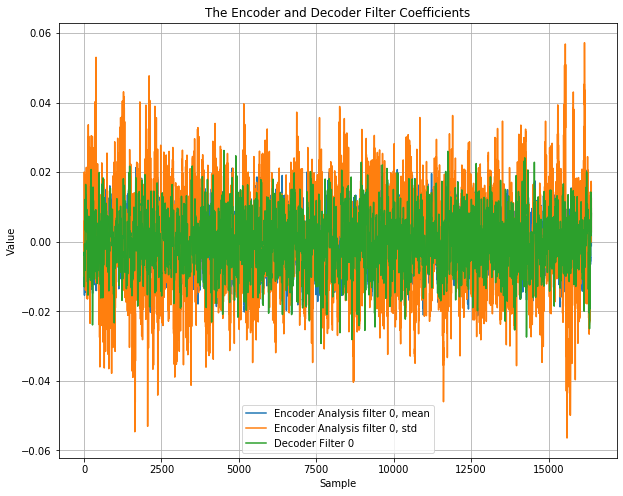

In [21]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

After training the program first displays the weights of the autoencoder and decoder, then it plots the coefficents in the encoded domain, and the added noise controlled by the "encoderstd" network. The latter should be as close as possible to 1.

It first lets the autoencoder run on the training set without additional noise, and plays back the result. Observe that it already sounds a little noisy. 

Then it add noise with unit standard deviation (value of 1).
Observe that it sounds more noisy.

In [22]:
#Test on training set:
    
#predictions=model(X).cpu() # Make Predictions based on the obtained weights, on training set
#noisy case:
#predictions, Yencmean, Yencstd = model(X)
Yencmean=model.encodermean(X)
    
#no noise case
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#Add gaussian noise with unit standard deviation to encoded signal:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2

Yencstd.shape= (2, 32, 36)
predictions.shape= (2, 1, 286722)


In [23]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


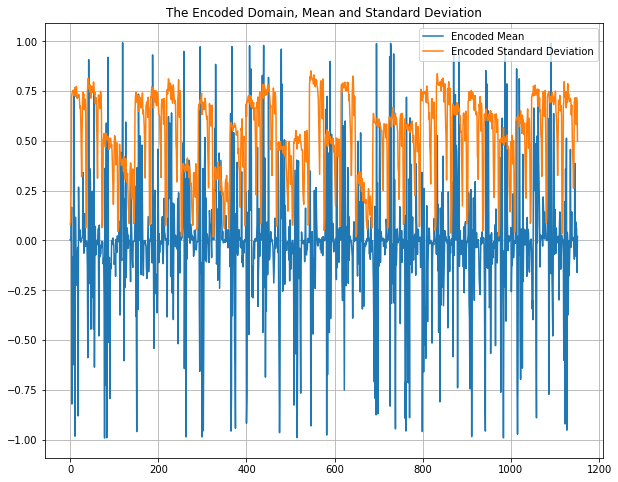

C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


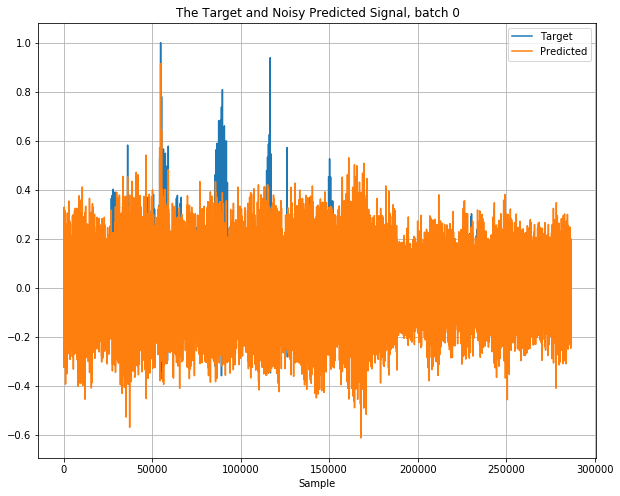

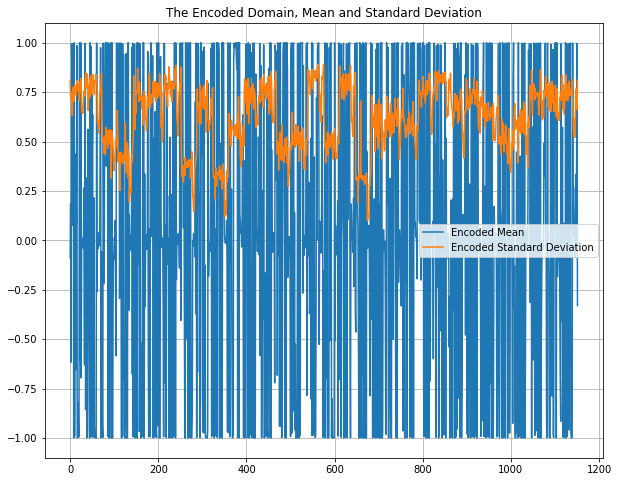

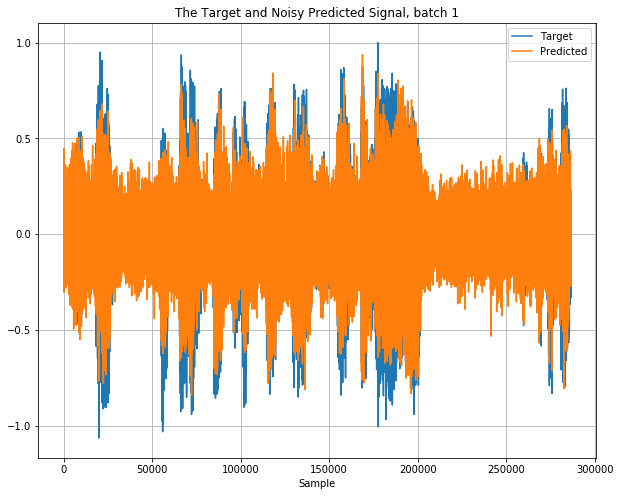

In [24]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    #print("np.reshape(Yencstd[b,:,:],(1,-1))", np.reshape(Yencstd[b,:,:],(1,-1)))
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    #No noise case:
    xrek=predclean[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

Then it uses a validation signal without and with noise. Observe that it appears less robust to the noise.

Then it plays the result for a validation input and on pure noise on the input. In both cases it produces a mix of the training set speech pieces.

The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


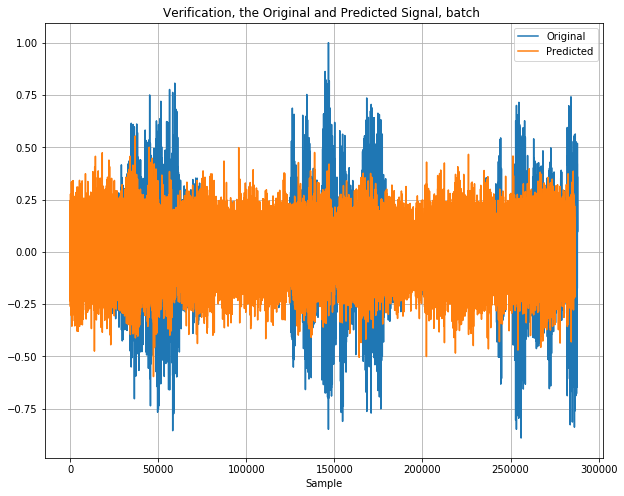

In [25]:
#Test on Verification set:
#fs, x= wav.read('test.wav')
x, fs = librosa.load("./audio/Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
#fs, x= wav.read('test2.wav')
#x=x*1.0/2**15 #normalize
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#No noise case:
xrek=predclean[0,0,:]  #remove unnecessary dimension for playback
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
#Add gaussian noise with unit standard deviation:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

### Experiment 2:

Use our alternative variational loss function for the training:

`vl=variational_loss2(Yencmean, Yencstd)`

In [44]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/NdQhjo_8vdY?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

In [26]:
#alternative: speech:
#make training set with batch of 2 speech signals:
batch=2;
#fs, x0= wav.read('./audio/test2.wav') #get size of the speech files, all need to be identical
x0, fs = librosa.load("./audio/Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        #fs, x0= wav.read('./audio/test2.wav')
        x0, fs = librosa.load("./audio/Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        #fs, x0= wav.read('./audio/test3.wav')
        x0, fs = librosa.load("./audio/Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    #x=x*1.0/2**15 #normalize
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) #Convert to pytorch format, batch is first dimension    
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  #MSE

x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [27]:
Ypred, Yencmean, Yencstd = model(X)
    
#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  #the target signal with same length as model output
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_variational_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
"""
#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
#Ypred=model(X)
#Ypred=Ypred.detach()
#print("Ypred=", Ypred)
    
#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

outputlen= 286722
Input X.shape= torch.Size([2, 1, 288000])
Target Y.shape= torch.Size([2, 1, 286722])
Target Y= tensor([[[ 1.3333e-04,  3.9998e-04,  2.2221e-04,  ..., -2.1332e-03,
          -1.9999e-03, -1.7777e-03]],

        [[-7.2650e-02, -7.6821e-02, -7.2650e-02,  ...,  1.6392e-01,
           1.3665e-01,  1.0216e-01]]])
Y.type()= torch.FloatTensor


In [28]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(2000):
        #Ypred, Yencmean, Yencstd = model(X)
        #mean values from the encoder network:
        Yencmean=model.encodermean(X)
          
        #standard deviation values from the network:
        Yencstd=model.encoderstd(X)
        #unit standard deviation:
        #Yencstd=torch.ones(Yencmean.shape)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        #vl=variational_loss(Yencmean, Yencstd)
        vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0.01*vl
        #loss= mse 
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.012561511248350143 variational loss= 0.9264770150184631
10 mse= 0.012568561360239983 variational loss= 0.6883672475814819
20 mse= 0.012534184381365776 variational loss= 0.5623303651809692
30 mse= 0.012311606667935848 variational loss= 0.48831164836883545
40 mse= 0.01209969725459814 variational loss= 0.44226881861686707
50 mse= 0.011960181407630444 variational loss= 0.4118953049182892
60 mse= 0.011820326559245586 variational loss= 0.3904719650745392
70 mse= 0.01114724762737751 variational loss= 0.37582242488861084
80 mse= 0.010795767419040203 variational loss= 0.3649192750453949
90 mse= 0.010723245330154896 variational loss= 0.3582271337509155
100 mse= 0.010416285134851933 variational loss= 0.35272955894470215
110 mse= 0.009899986907839775 variational loss= 0.3501223027706146
120 mse= 0.00952900666743517 variational loss= 0.3479520082473755
130 mse= 0.00976206548511982 variational loss= 0.3472225069999695
140 mse= 0.009093952365219593 variational loss= 0.34648552536964417
150 m

1220 mse= 0.0048857866786420345 variational loss= 0.47433269023895264
1230 mse= 0.004640083760023117 variational loss= 0.47609058022499084
1240 mse= 0.004864050541073084 variational loss= 0.4761272072792053
1250 mse= 0.004703990649431944 variational loss= 0.47732529044151306
1260 mse= 0.004852588288486004 variational loss= 0.4770844280719757
1270 mse= 0.00489296019077301 variational loss= 0.4787977635860443
1280 mse= 0.0047272793017327785 variational loss= 0.47949039936065674
1290 mse= 0.004706377163529396 variational loss= 0.4785078763961792
1300 mse= 0.004638143815100193 variational loss= 0.47669875621795654
1310 mse= 0.004765796009451151 variational loss= 0.4785231053829193
1320 mse= 0.004678774159401655 variational loss= 0.480731338262558
1330 mse= 0.004460141062736511 variational loss= 0.482513427734375
1340 mse= 0.004809103440493345 variational loss= 0.4828363060951233
1350 mse= 0.004798928741365671 variational loss= 0.4822504222393036
1360 mse= 0.004451227840036154 variational l

MSE= 0.003764733672142029 Variational Loss: 0.5931174159049988
ww= OrderedDict([('conv1mean.weight', tensor([[[ 9.2285e-03, -3.7007e-03, -4.3859e-03,  ..., -3.7931e-03,
          -4.4420e-03, -6.8428e-03]],

        [[-1.7171e-03, -9.1853e-04,  5.9262e-03,  ..., -4.6762e-03,
           6.1215e-03, -5.5758e-03]],

        [[-1.1669e-03, -1.0211e-03, -9.6664e-03,  ..., -6.0180e-03,
          -7.2832e-03, -6.3338e-03]],

        ...,

        [[ 6.9043e-03, -3.9184e-03, -3.0605e-03,  ..., -8.0496e-03,
           3.5124e-03, -2.4770e-05]],

        [[-6.5857e-03, -1.0795e-02,  5.4980e-04,  ..., -9.3283e-03,
          -8.4806e-03, -2.8933e-03]],

        [[ 4.3421e-03, -9.3345e-03,  3.3586e-03,  ..., -7.4618e-03,
          -4.6013e-03,  2.0197e-03]]])), ('conv1mean.bias', tensor([-1.4661e-03, -1.8467e-03, -7.6189e-04, -4.0791e-03,  4.9388e-03,
        -1.4455e-04, -6.2545e-04, -4.6747e-03, -1.6934e-03,  3.9749e-03,
        -5.2851e-03,  3.3824e-03, -2.9442e-03, -7.0930e-03,  3.2512e-03,
   

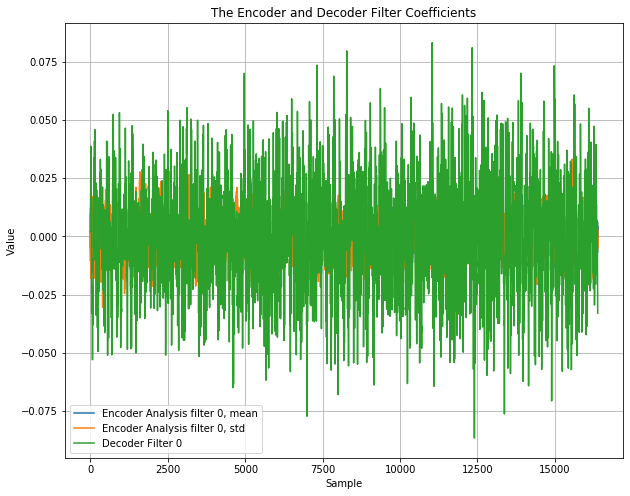

In [29]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

In [30]:
#Test on training set:
    
#predictions=model(X).cpu() # Make Predictions based on the obtained weights, on training set
#noisy case:
#predictions, Yencmean, Yencstd = model(X)
Yencmean=model.encodermean(X)
    
#no noise case
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#Add gaussian noise with unit standard deviation to encoded signal:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2

Yencstd.shape= (2, 32, 36)
predictions.shape= (2, 1, 286722)


In [31]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


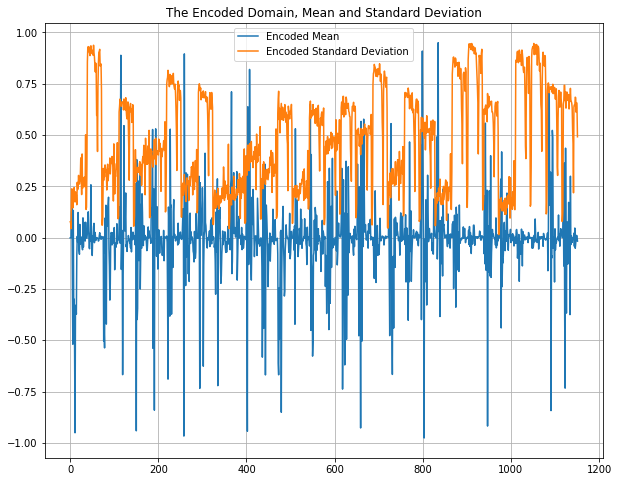

C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


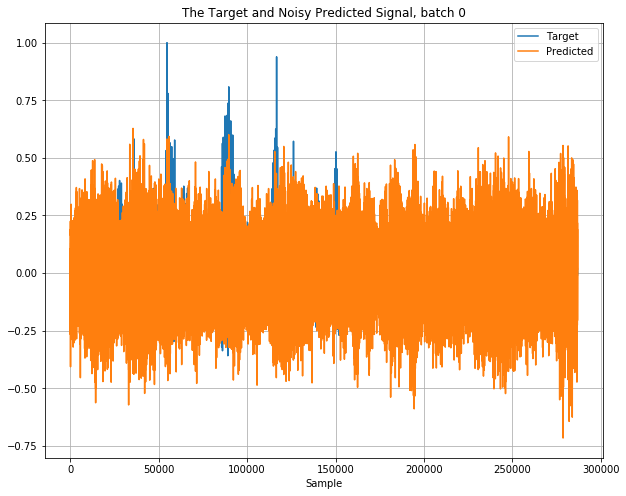

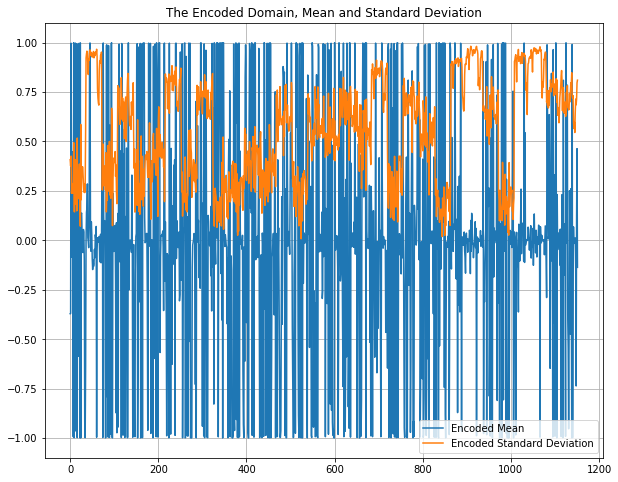

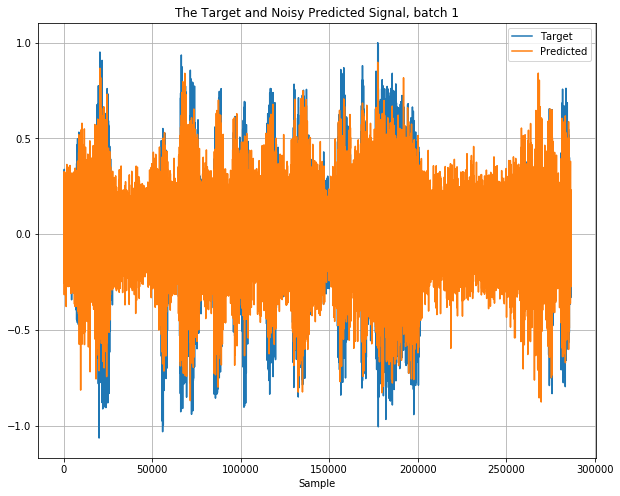

In [32]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    #print("np.reshape(Yencstd[b,:,:],(1,-1))", np.reshape(Yencstd[b,:,:],(1,-1)))
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    #No noise case:
    xrek=predclean[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

Observe the plot of the added noise after training: It is now less close to 1, because this loss "punished" lower noise values less. This means the autoencoder is now more sensitive to noise. Even the "clean" version is not so clean.

The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


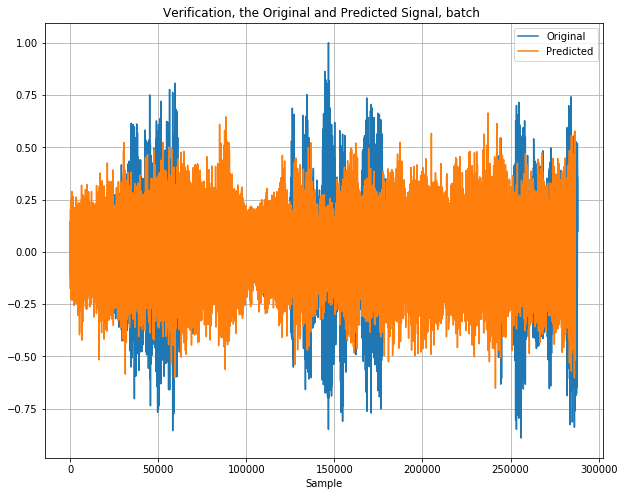

In [33]:
#Test on Verification set:
#fs, x= wav.read('test.wav')
x, fs = librosa.load("./audio/Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
#fs, x= wav.read('test2.wav')
#x=x*1.0/2**15 #normalize
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#No noise case:
xrek=predclean[0,0,:]  #remove unnecessary dimension for playback
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
#Add gaussian noise with unit standard deviation:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

Then it plays the result for a validation input and on pure noise on the input. Again In both cases it produces a mix of the training set speech pieces.

### Experiment 3

Use fixed noise with unit standard variance in the training process. This also means we don't need the variational loss anymore, since the added noise is fixed:

```python
Yencstd=torch.ones(Yencmean.shape)
loss= mse + 0.0*vl
```

In [45]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/SzgRYTRJN5o?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

In [34]:
#alternative: speech:
#make training set with batch of 2 speech signals:
batch=2;
#fs, x0= wav.read('./audio/test2.wav') #get size of the speech files, all need to be identical
x0, fs = librosa.load("./audio/Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        #fs, x0= wav.read('./audio/test2.wav')
        x0, fs = librosa.load("./audio/Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        #fs, x0= wav.read('./audio/test3.wav')
        x0, fs = librosa.load("./audio/Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    #x=x*1.0/2**15 #normalize
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) #Convert to pytorch format, batch is first dimension    
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  #MSE

x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [35]:
Ypred, Yencmean, Yencstd = model(X)
    
#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  #the target signal with same length as model output
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_variational_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
"""
#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
#Ypred=model(X)
#Ypred=Ypred.detach()
#print("Ypred=", Ypred)
    
#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

outputlen= 286722
Input X.shape= torch.Size([2, 1, 288000])
Target Y.shape= torch.Size([2, 1, 286722])
Target Y= tensor([[[ 1.3333e-04,  3.9998e-04,  2.2221e-04,  ..., -2.1332e-03,
          -1.9999e-03, -1.7777e-03]],

        [[-7.2650e-02, -7.6821e-02, -7.2650e-02,  ...,  1.6392e-01,
           1.3665e-01,  1.0216e-01]]])
Y.type()= torch.FloatTensor


In [36]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(2000):
        #Ypred, Yencmean, Yencstd = model(X)
        #mean values from the encoder network:
        Yencmean=model.encodermean(X)
          
        #standard deviation values from the network:
        #Yencstd=model.encoderstd(X)
        #unit standard deviation:
        Yencstd=torch.ones(Yencmean.shape)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        #vl=variational_loss(Yencmean, Yencstd)
        vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0*vl
        #loss= mse 
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.013892386108636856 variational loss= 0.0038377149030566216
10 mse= 0.013780061155557632 variational loss= 0.011225515976548195
20 mse= 0.013450627215206623 variational loss= 0.026825828477740288
30 mse= 0.013149349950253963 variational loss= 0.05446532368659973
40 mse= 0.012823622673749924 variational loss= 0.08953303843736649
50 mse= 0.012338453903794289 variational loss= 0.12765875458717346
60 mse= 0.011762617155909538 variational loss= 0.16773277521133423
70 mse= 0.01128415297716856 variational loss= 0.20445214211940765
80 mse= 0.010708744637668133 variational loss= 0.23622626066207886
90 mse= 0.01031399704515934 variational loss= 0.2641298472881317
100 mse= 0.009806457906961441 variational loss= 0.28694629669189453
110 mse= 0.009265066124498844 variational loss= 0.30615249276161194
120 mse= 0.009123881347477436 variational loss= 0.3227730691432953
130 mse= 0.008881151676177979 variational loss= 0.33714309334754944
140 mse= 0.008485411293804646 variational loss= 0.349893838

1230 mse= 0.006917978636920452 variational loss= 0.6462208032608032
1240 mse= 0.0072243777103722095 variational loss= 0.6470242738723755
1250 mse= 0.007031829562038183 variational loss= 0.6478278636932373
1260 mse= 0.007281057070940733 variational loss= 0.6487516760826111
1270 mse= 0.007003591395914555 variational loss= 0.64949631690979
1280 mse= 0.006603186018764973 variational loss= 0.6501479148864746
1290 mse= 0.006907270755618811 variational loss= 0.6508514881134033
1300 mse= 0.0068262978456914425 variational loss= 0.6516243815422058
1310 mse= 0.0069421869702637196 variational loss= 0.6522932648658752
1320 mse= 0.006868966389447451 variational loss= 0.6528466939926147
1330 mse= 0.006855321582406759 variational loss= 0.6536279916763306
1340 mse= 0.007086408324539661 variational loss= 0.6546149253845215
1350 mse= 0.006770099047571421 variational loss= 0.6553177833557129
1360 mse= 0.007046502083539963 variational loss= 0.655875563621521
1370 mse= 0.006898621097207069 variational loss=

MSE= 0.00680132769048214 Variational Loss: 0.34290042519569397
ww= OrderedDict([('conv1mean.weight', tensor([[[ 0.0071,  0.0065,  0.0025,  ...,  0.0335,  0.0354,  0.0335]],

        [[-0.0045,  0.0056,  0.0006,  ..., -0.0023,  0.0059,  0.0009]],

        [[ 0.0068,  0.0031,  0.0032,  ...,  0.0053, -0.0042, -0.0030]],

        ...,

        [[ 0.0069,  0.0017, -0.0033,  ...,  0.0129,  0.0123,  0.0009]],

        [[ 0.0140,  0.0139,  0.0224,  ..., -0.0148, -0.0112, -0.0115]],

        [[-0.0080, -0.0109, -0.0160,  ...,  0.0018,  0.0056,  0.0049]]])), ('conv1mean.bias', tensor([ 0.0040, -0.0127,  0.0068,  0.0105, -0.0050, -0.0232, -0.0089,  0.0015,
         0.0322, -0.0113,  0.0081,  0.0106, -0.0145,  0.0019,  0.0088,  0.0047,
         0.0059,  0.0014, -0.0025, -0.0171, -0.0008,  0.0244,  0.0044,  0.0157,
         0.0106,  0.0156,  0.0066,  0.0175,  0.0176,  0.0090,  0.0155, -0.0066])), ('conv1std.weight', tensor([[[-0.0063, -0.0047,  0.0042,  ...,  0.0059, -0.0060, -0.0068]],

        [[

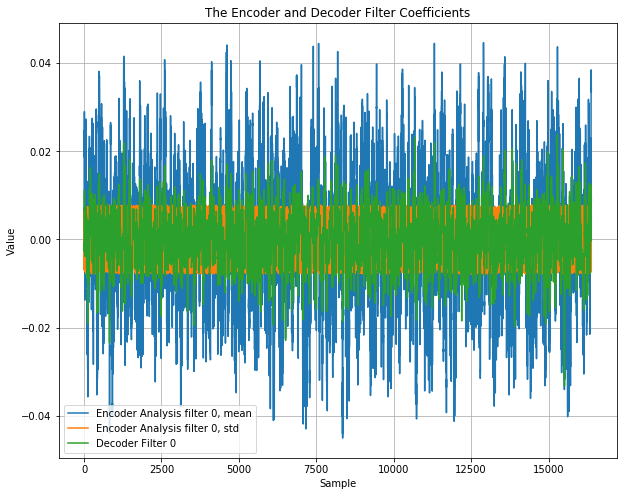

In [37]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

In [38]:
#Test on training set:
    
#predictions=model(X).cpu() # Make Predictions based on the obtained weights, on training set
#noisy case:
#predictions, Yencmean, Yencstd = model(X)
Yencmean=model.encodermean(X)
    
#no noise case
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#Add gaussian noise with unit standard deviation to encoded signal:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2

Yencstd.shape= (2, 32, 36)
predictions.shape= (2, 1, 286722)


In [39]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


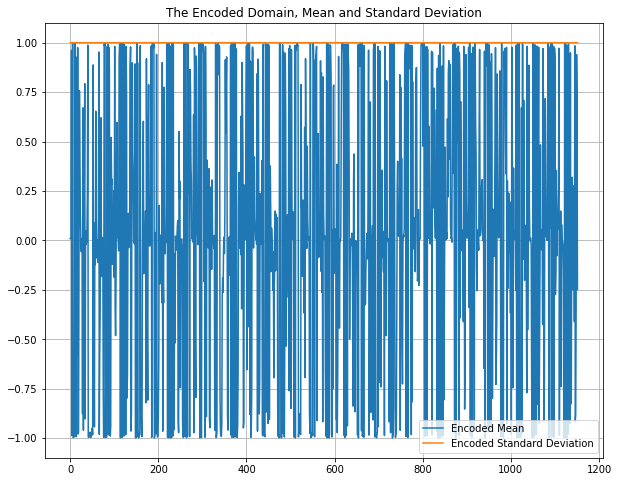

C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


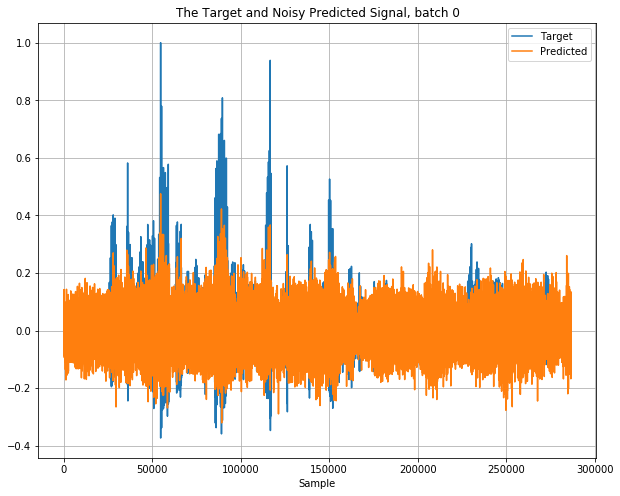

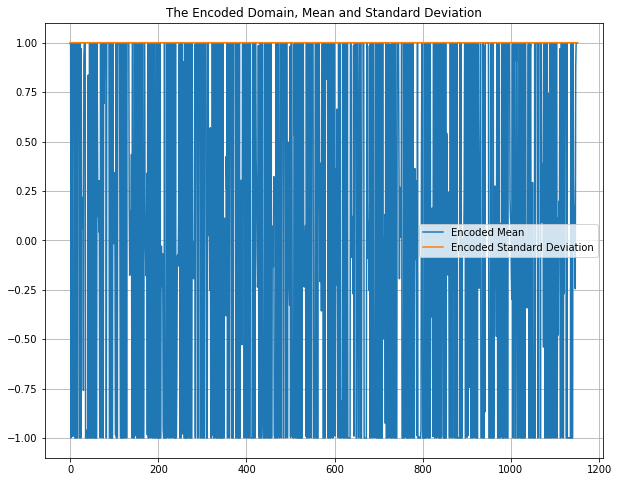

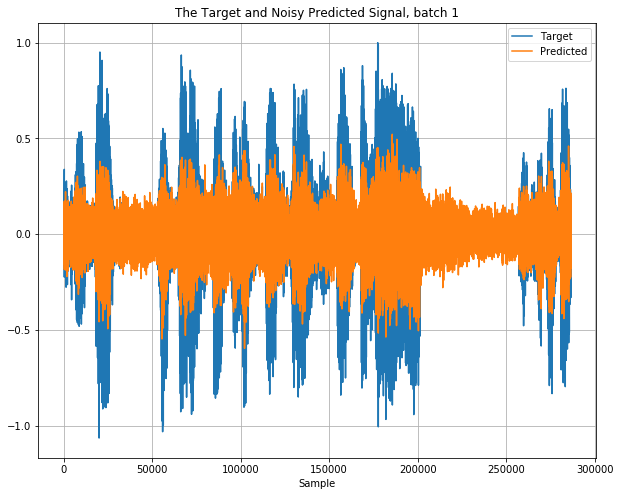

In [40]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    #print("np.reshape(Yencstd[b,:,:],(1,-1))", np.reshape(Yencstd[b,:,:],(1,-1)))
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    #No noise case:
    xrek=predclean[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

After training the plot with the added noise shows that it is indeed a constant 1. But after playing back the clean signal we can hear that this now sounds somewhat less clean than in the first case.

But on the plus side, it seems to be indeed more robust against noise in the encoded domain, sounding less noisy there.

The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


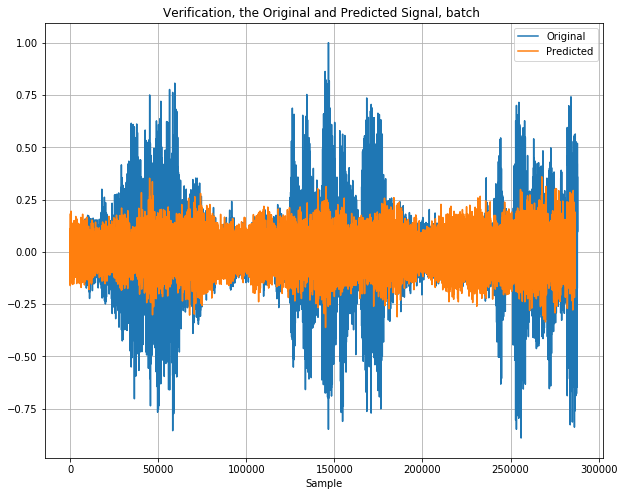

In [41]:
#Test on Verification set:
#fs, x= wav.read('test.wav')
x, fs = librosa.load("./audio/Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
#fs, x= wav.read('test2.wav')
#x=x*1.0/2**15 #normalize
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#No noise case:
xrek=predclean[0,0,:]  #remove unnecessary dimension for playback
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
#Add gaussian noise with unit standard deviation:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

And again In both cases it produces a mix of the training set speech pieces.

But keep in mind that this last case has the advantage that it does not need a neural network for the standard deviation prediction.